### <h1><b>Beginning</b></h1>

In [ ]:
import os
import keras
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet', include_top=True)

553476096/553467096 [==============================] - 6s 0us/step


Summary of model

In [ ]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
def load_image(path):
    img = image.load_img(path, target_size=model.input_shape[1:3])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x

Feature extraction


In [ ]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)
feat_extractor.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/features.txt", "rb") as file:
  content = pickle.load(file)
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/all_files.txt", "rb") as file:
  files = pickle.load(file)

In [ ]:
print(np.array(content[0:2]))
from sklearn.decomposition import PCA

content = np.array(content)
pca = PCA(n_components=512)
pca.fit(content)

[[3.5324712 0.        0.        ... 0.        4.8046694 0.5606307]
 [0.        0.        0.        ... 0.        0.        0.       ]]


PCA(n_components=512)

In [ ]:
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/pca.txt", "wb") as file:
  pickle.dump(pca, file)

In [ ]:
pca_features = pca.transform(content)

In [ ]:
print(np.array(pca_features[0:2]))
print(len(pca_features))

[[53.35012    12.380224   -4.323224   ... -0.08552976  0.54554135
  -1.6871635 ]
 [-1.0673926   7.4675827  -6.0638266  ...  2.2095838   0.8233364
  -1.575429  ]]
92424


In [ ]:
import pickle
with open("reduced_features.txt", "wb") as file:
  pickle.dump(pca_features, file)

In [ ]:
!mv "/content/reduced_features.txt" "/content/gdrive/MyDrive/NN/cocodataset/final/p1/reduced_features.txt"

In [ ]:
print(len(content))
print(len(files))

92424
92424


In [ ]:
def get_closest_images(query_image_idx, num_results=5):
    distances = [ distance.cosine(content[query_image_idx], feat) for feat in content ]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results+1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    for idx in indexes:
      
        img = image.load_img(files[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image


Testing with random images

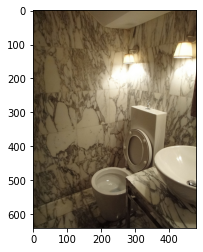

In [ ]:
import random

query_image_idx = int(len(content) * random.random())

img = image.load_img(files[query_image_idx])
plt.imshow(img)

In [ ]:
from scipy.spatial import distance

similar_idx = [ distance.cosine(content[query_image_idx], feat) for feat in content ]
idx_closest = sorted(range(len(similar_idx)), key=lambda k: similar_idx[k])[0:6]

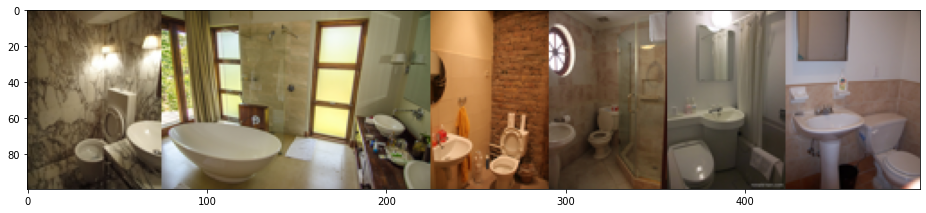

In [ ]:
import numpy as np
thumbs = []
for idx in idx_closest:
    img = image.load_img(files[idx])
    img = img.resize((int(img.width * 100 / img.height), 100))
    thumbs.append(img)

concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)

plt.figure(figsize = (16,12))
plt.imshow(concat_image)


Text(0.5, 1.0, 'result images')

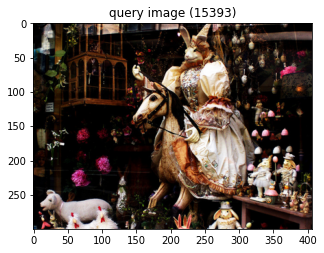

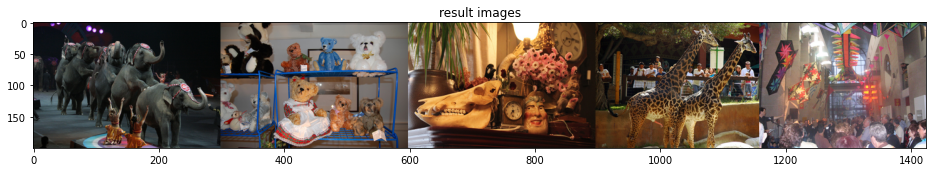

In [ ]:
import random

query_image_idx = int(len(content) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

### <h1><b>Importing new images</b></h1>


In [ ]:
new_image, x = load_image("/content/gdrive/MyDrive/NN/cocodataset/artificial/changed/100 img_blur.png")

new_features = feat_extractor.predict(x)

In [ ]:
predictions = model.predict(x)
for _, pred, prob in decode_predictions(predictions)[0]:
    print("Predicted %s with probability %0.3f" % (pred, prob))

Predicted lampshade with probability 0.186
Predicted table_lamp with probability 0.075
Predicted espresso_maker with probability 0.062
Predicted spotlight with probability 0.060
Predicted coil with probability 0.060


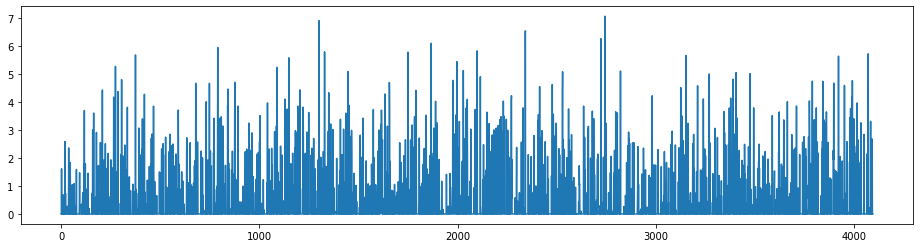

In [ ]:
img, x = load_image("/content/gdrive/MyDrive/NN/cocodataset/artificial/changed/100 img_blur.png")
feat = feat_extractor.predict(x)

plt.figure(figsize=(16,4))
plt.plot(feat[0])

Text(0.5, 1.0, 'Results')

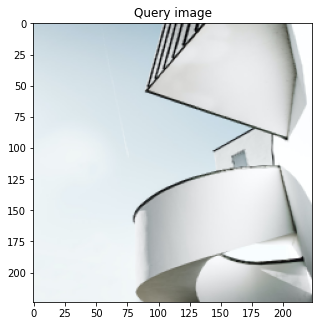

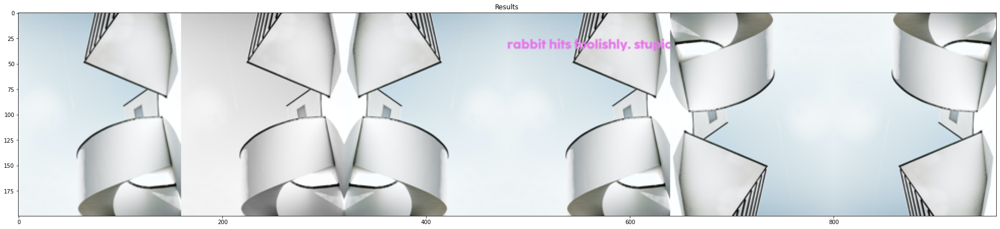

In [ ]:
from scipy.spatial import distance

distances = [ distance.cosine(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:6]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image)
plt.title("Results")

### <h1><b>Distance algorithms</b></h1>

<h1>Euclidean Distance</h1>

Text(0.5, 1.0, 'Results')

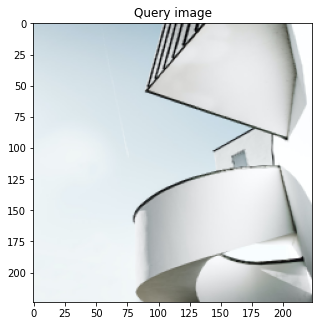

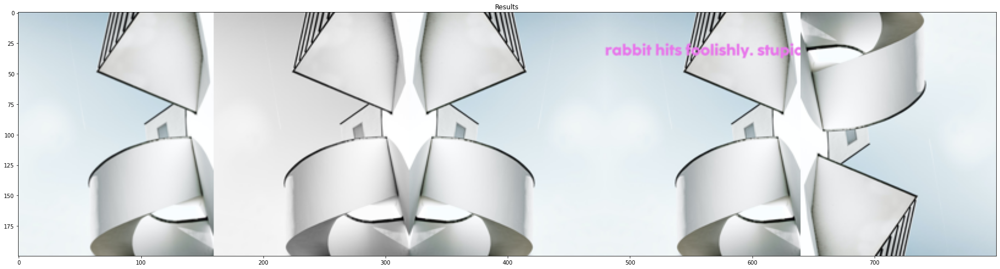

In [ ]:
from scipy.spatial import distance

distances = [ distance.euclidean(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:5]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,32))
plt.imshow(results_image)
plt.title("Results")

<h1>Manhattan Distance</h1>

Text(0.5, 1.0, 'Results')

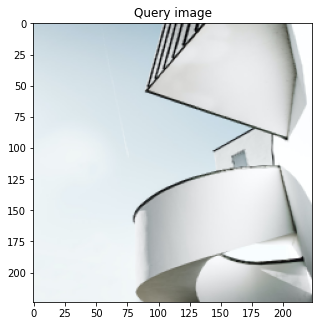

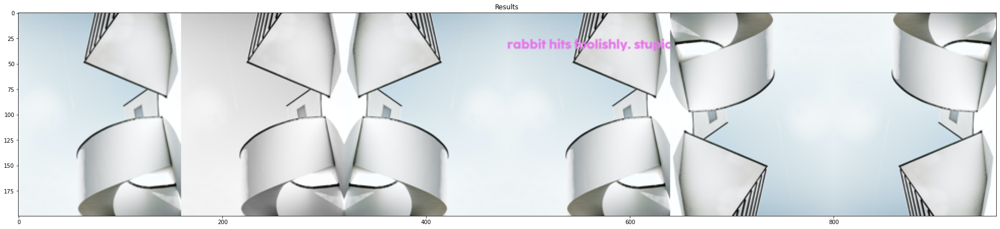

In [ ]:
from scipy.spatial import distance

distances = [ distance.cityblock(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:6]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image)
plt.title("Results")

<h1>Minkowski Distance</h1>

Text(0.5, 1.0, 'Results')

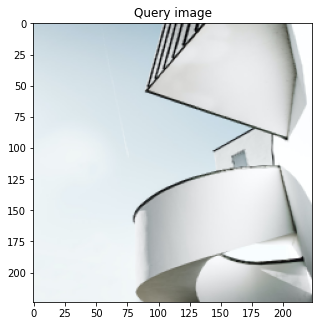

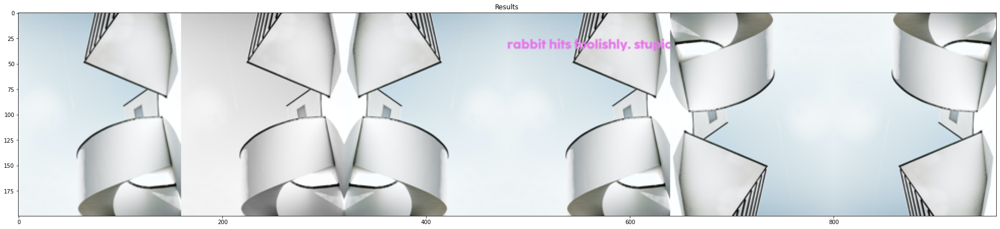

In [ ]:
from scipy.spatial import distance

distances = [ distance.minkowski(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:6]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image)
plt.title("Results")

<h1>Jaccard Distance</h1>

Text(0.5, 1.0, 'Results')

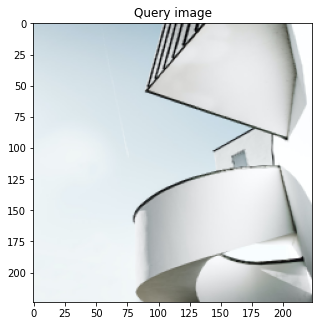

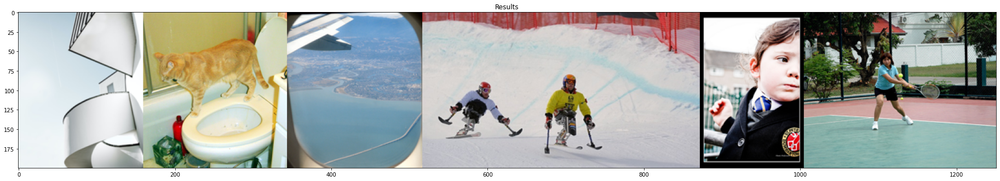

In [ ]:
from scipy.spatial import distance

distances = [ distance.jaccard(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:6]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image)
plt.title("Results")

<h1>Sorensen-Dice Distance</h1>

Text(0.5, 1.0, 'Results')

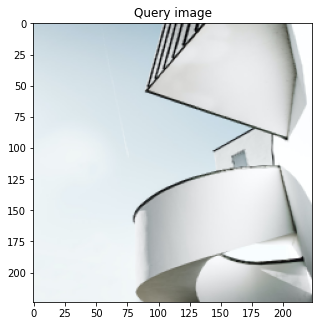

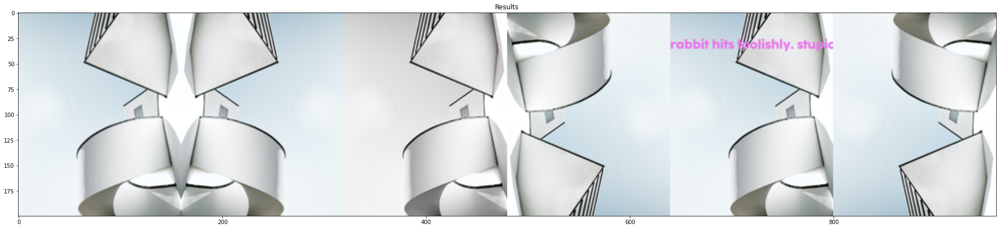

In [ ]:
from scipy.spatial import distance

distances = [ distance.dice(new_features, feat) for feat in content]
idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[0:6]
results_image = get_concatenated_images(idx_closest, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image)
plt.title("Results")

Better display of results

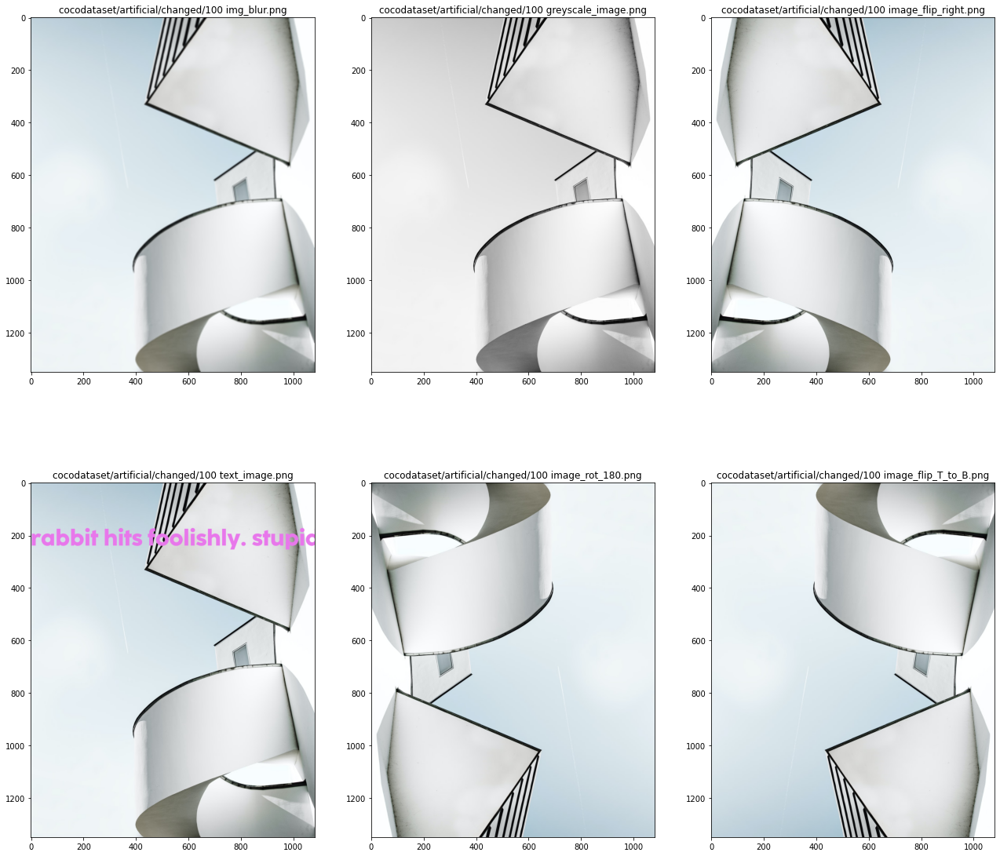

In [ ]:
#plt.figure(figsize=(32,30)) works the best
plt.figure(figsize=(22,20))
i=1
for x in idx_closest[0:6]:
  plt.subplot(2,3,i)
  img = image.load_img(files[x])
  plt.imshow(img)
  plt.title(files[x][27:])
  i+=1

Text(0.5, 1.0, 'Results according to Sorensen-Dice distance')

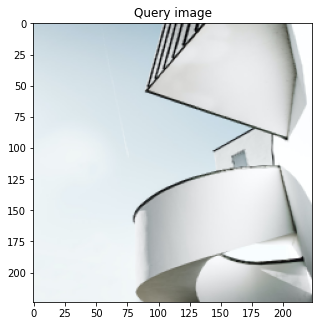

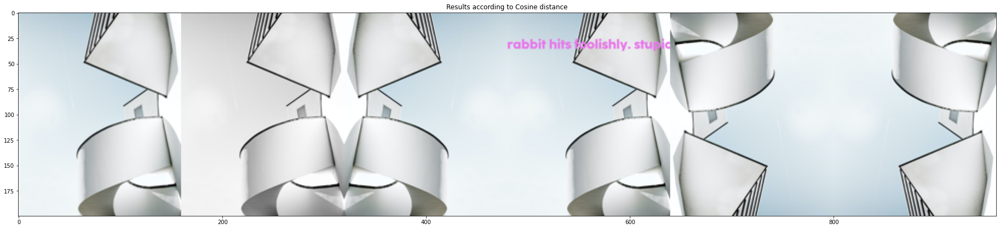

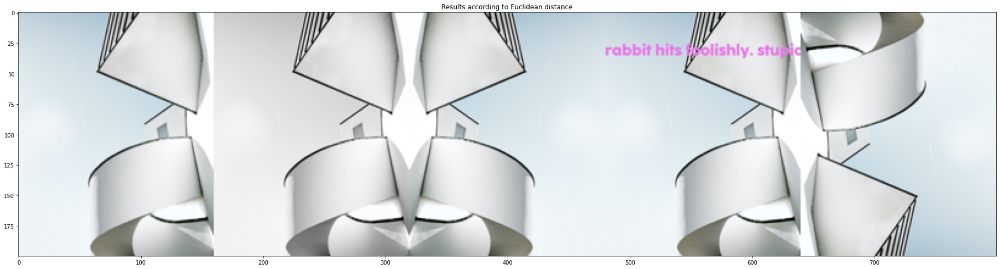

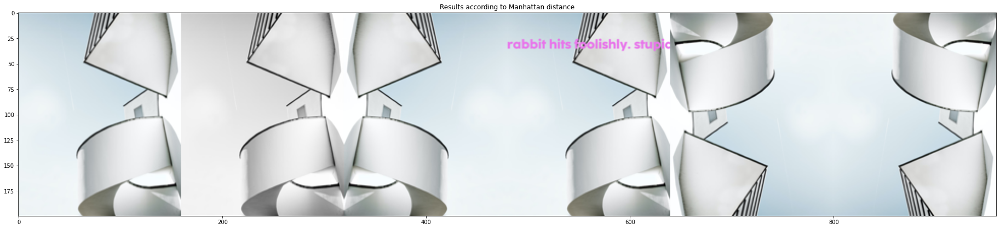

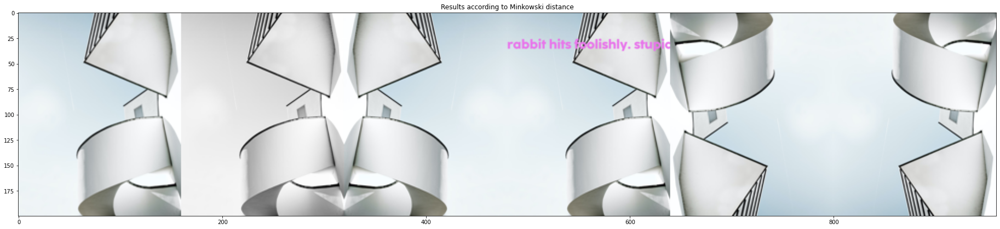

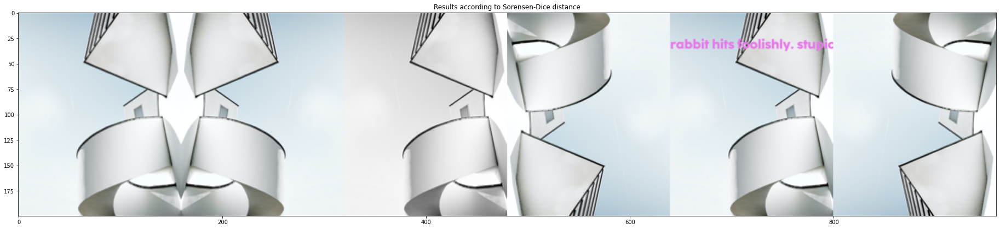

In [ ]:
from scipy.spatial import distance

distances_cosine = [ distance.cosine(new_features, feat) for feat in content]
idx_closest_cosine = sorted(range(len(distances_cosine)), key=lambda k: distances_cosine[k])[0:6]
results_image_cosine = get_concatenated_images(idx_closest_cosine, 200)

distances_euclidean = [ distance.euclidean(new_features, feat) for feat in content]
idx_closest_euclidean = sorted(range(len(distances_euclidean)), key=lambda k: distances_euclidean[k])[0:5]
results_image_euclidean = get_concatenated_images(idx_closest_euclidean, 200)

distances_manhattan = [ distance.cityblock(new_features, feat) for feat in content]
idx_closest_manhattan = sorted(range(len(distances_manhattan)), key=lambda k: distances_manhattan[k])[0:6]  
results_image_manhattan = get_concatenated_images(idx_closest_manhattan, 200)

distances_minkowski = [ distance.minkowski(new_features, feat) for feat in content]
idx_closest_minkowski = sorted(range(len(distances_minkowski)), key=lambda k: distances_minkowski[k])[0:6]  
results_image_minkowski = get_concatenated_images(idx_closest_minkowski, 200)

distances_sorensen = [ distance.dice(new_features, feat) for feat in content]
idx_closest_sorensen = sorted(range(len(distances_sorensen)), key=lambda k: distances_sorensen[k])[0:6] 
results_image_sorensen = get_concatenated_images(idx_closest_sorensen, 200)

plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize = (32,36))
plt.imshow(results_image_cosine)
plt.title("Results according to Cosine distance")

plt.figure(figsize = (32,36))
plt.imshow(results_image_euclidean)
plt.title("Results according to Euclidean distance")

plt.figure(figsize = (32,36))
plt.imshow(results_image_manhattan)
plt.title("Results according to Manhattan distance")

plt.figure(figsize = (32,36))
plt.imshow(results_image_minkowski)
plt.title("Results according to Minkowski distance")

plt.figure(figsize = (32,36))
plt.imshow(results_image_sorensen)
plt.title("Results according to Sorensen-Dice distance")

In [ ]:
print(idx_closest_sorensen[0:5])

[92217, 92248, 91983, 92257, 91713]


In [ ]:
total_list = []
for x in idx_closest_cosine[0:10]:
  total_list.append(x)
for x in idx_closest_euclidean[0:10]:
  total_list.append(x)
for x in idx_closest_manhattan[0:10]:
  total_list.append(x)
for x in idx_closest_minkowski[0:10]:
  total_list.append(x)
for x in idx_closest_sorensen[0:10]:
  total_list.append(x)
print(len(total_list))

from collections import Counter
final = Counter(total_list)

final2 = sorted(final.items())

29


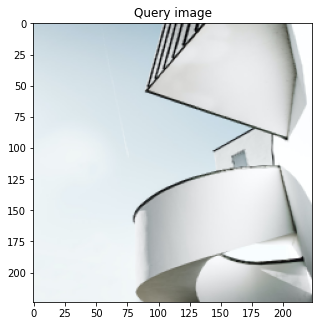

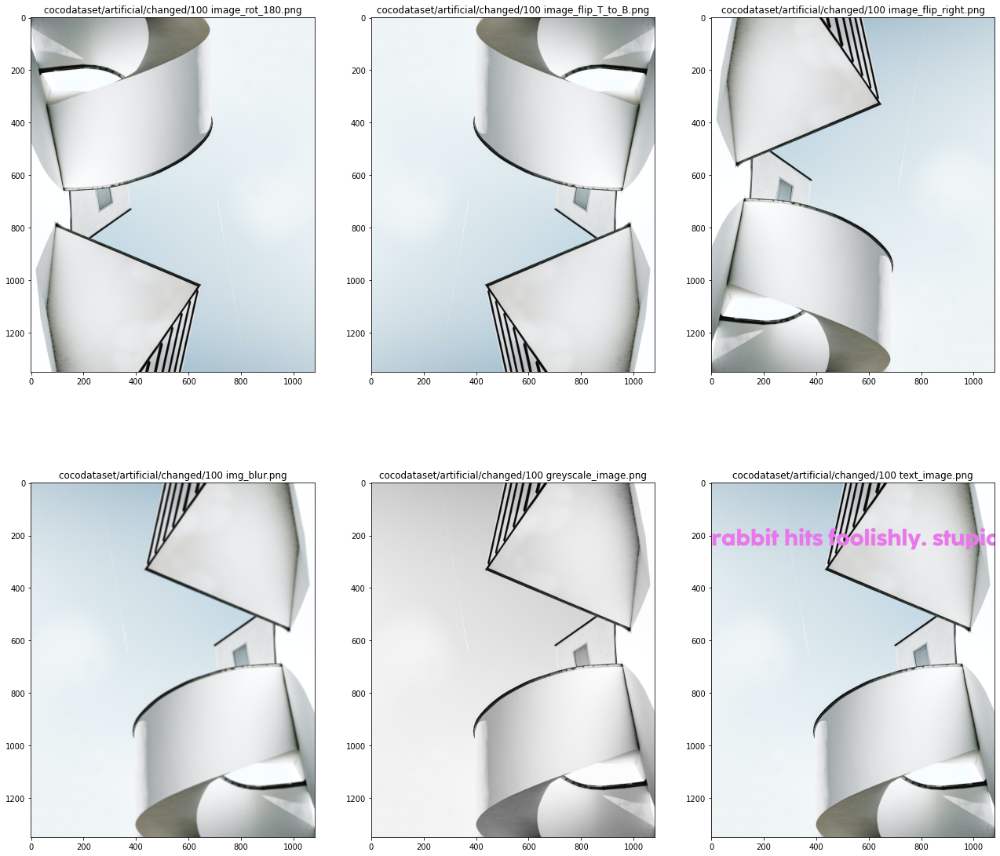

In [ ]:
plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.title("Query image")

plt.figure(figsize=(22,20))
i=1
for x in final2[0:6]:
  plt.subplot(2,3,i)
  img = image.load_img(files[x[0]])
  plt.imshow(img)
  plt.title(files[x[0]][27:])
  i+=1

### <h1><b>FINAL DEMO</b></h1>

In [ ]:
import os
import keras
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import pickle
from sklearn.decomposition import PCA

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet', include_top=True)

553476096/553467096 [==============================] - 5s 0us/step


In [ ]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)
feat_extractor.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/features.txt", "rb") as file:
  content = pickle.load(file)
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/all_files.txt", "rb") as file:
  files = pickle.load(file)
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/reduced_features.txt", "rb") as file:
  pca_features = pickle.load(file)
with open("/content/gdrive/MyDrive/NN/cocodataset/final/p1/pca.txt", "rb") as file:
  pca = pickle.load(file)

In [ ]:
def load_image(path):
    img = image.load_img(path, target_size=model.input_shape[1:3])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x
    
def get_closest_images(query_image_idx, num_results=5):
    distances = [ distance.cosine(content[query_image_idx], feat) for feat in content ]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results+1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    for idx in indexes:
      
        img = image.load_img(files[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image


In [ ]:
new_image, x = load_image("/content/gdrive/MyDrive/NN/cocodataset/artificial/Copy of 000000000013.jpg")

new_features = feat_extractor.predict(x)
new_pca_features = pca.transform(new_features)[0]

In [ ]:
print(new_features[0:20])

[[0.        0.        1.2190189 ... 2.549183  3.237205  0.       ]]


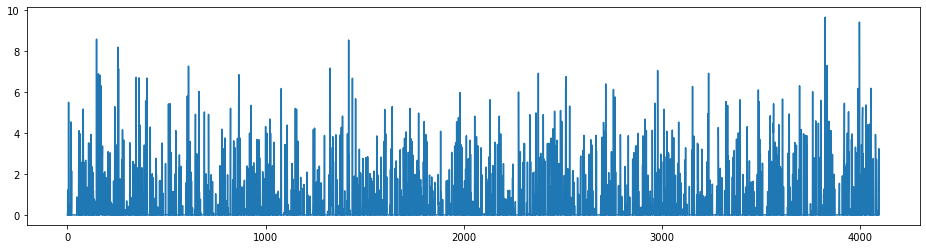

In [ ]:
img, x = load_image("/content/gdrive/MyDrive/NN/cocodataset/artificial/Copy of 000000000013.jpg")
feat = feat_extractor.predict(x)

plt.figure(figsize=(16,4))
plt.plot(feat[0])

In [ ]:
from scipy.spatial import distance

distances_cosine = [ distance.cosine(new_features, feat) for feat in content]
idx_closest_cosine = sorted(range(len(distances_cosine)), key=lambda k: distances_cosine[k])[0:6]

distances_euclidean = [ distance.euclidean(new_features, feat) for feat in content]
idx_closest_euclidean = sorted(range(len(distances_euclidean)), key=lambda k: distances_euclidean[k])[0:6]

distances_manhattan = [ distance.cityblock(new_features, feat) for feat in content]
idx_closest_manhattan = sorted(range(len(distances_manhattan)), key=lambda k: distances_manhattan[k])[0:6]

distances_minkowski = [ distance.minkowski(new_features, feat) for feat in content]
idx_closest_minkowski = sorted(range(len(distances_minkowski)), key=lambda k: distances_minkowski[k])[0:6]

distances_sorensen = [ distance.dice(new_features, feat) for feat in content]
idx_closest_sorensen = sorted(range(len(distances_sorensen)), key=lambda k: distances_sorensen[k])[0:6]

In [ ]:
total_list = []
for x in idx_closest_cosine[0:6]:
  total_list.append(x)
for x in idx_closest_euclidean[0:6]:
  total_list.append(x)
for x in idx_closest_manhattan[0:6]:
  total_list.append(x)
for x in idx_closest_minkowski[0:6]:
  total_list.append(x)
for x in idx_closest_sorensen[0:6]:
  total_list.append(x)

print(len(total_list))

from collections import Counter
final = Counter(total_list)

final2 = sorted(final.items(), reverse=True)

30


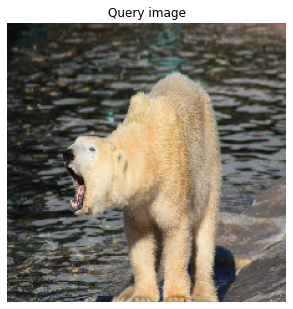

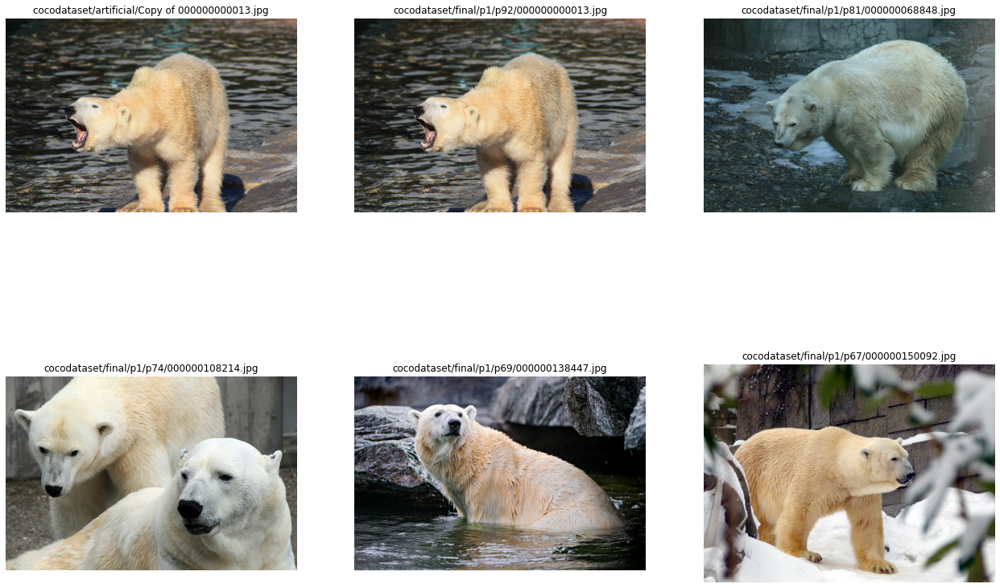

In [ ]:
plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.axis('off')
plt.title("Query image")

#alt is 22,20
plt.figure(figsize=(22,15))
i=1
for x in final2[0:6]:
  plt.subplot(2,3,i)
  img = image.load_img(files[x[0]])
  plt.imshow(img)
  plt.axis('off')
  plt.title(files[x[0]][27:])
  i+=1

<h1>Reduced features</h1>

In [ ]:
from scipy.spatial import distance

distances_cosine = [ distance.cosine(new_pca_features, feat) for feat in pca_features]
idx_closest_cosine = sorted(range(len(distances_cosine)), key=lambda k: distances_cosine[k])[0:6]

distances_euclidean = [ distance.euclidean(new_pca_features, feat) for feat in pca_features]
idx_closest_euclidean = sorted(range(len(distances_euclidean)), key=lambda k: distances_euclidean[k])[0:6] 

distances_manhattan = [ distance.cityblock(new_pca_features, feat) for feat in pca_features]
idx_closest_manhattan = sorted(range(len(distances_manhattan)), key=lambda k: distances_manhattan[k])[0:6] 

distances_minkowski = [ distance.minkowski(new_pca_features, feat) for feat in pca_features]
idx_closest_minkowski = sorted(range(len(distances_minkowski)), key=lambda k: distances_minkowski[k])[0:6]

distances_sorensen = [ distance.dice(new_pca_features, feat) for feat in pca_features]
idx_closest_sorensen = sorted(range(len(distances_sorensen)), key=lambda k: distances_sorensen[k])[0:6]

In [ ]:
total_list = []
for x in idx_closest_cosine[0:6]:
  total_list.append(x)
for x in idx_closest_euclidean[0:6]:
  total_list.append(x)
for x in idx_closest_manhattan[0:6]:
  total_list.append(x)
for x in idx_closest_minkowski[0:6]:
  total_list.append(x)
for x in idx_closest_sorensen[0:6]:
  total_list.append(x)

print(len(total_list))

from collections import Counter
final = Counter(total_list)

final2 = sorted(final.items(), reverse=True)

30


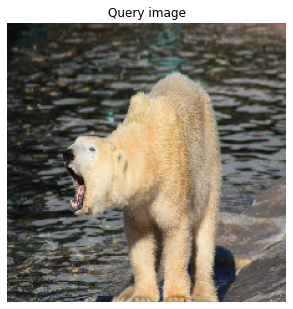

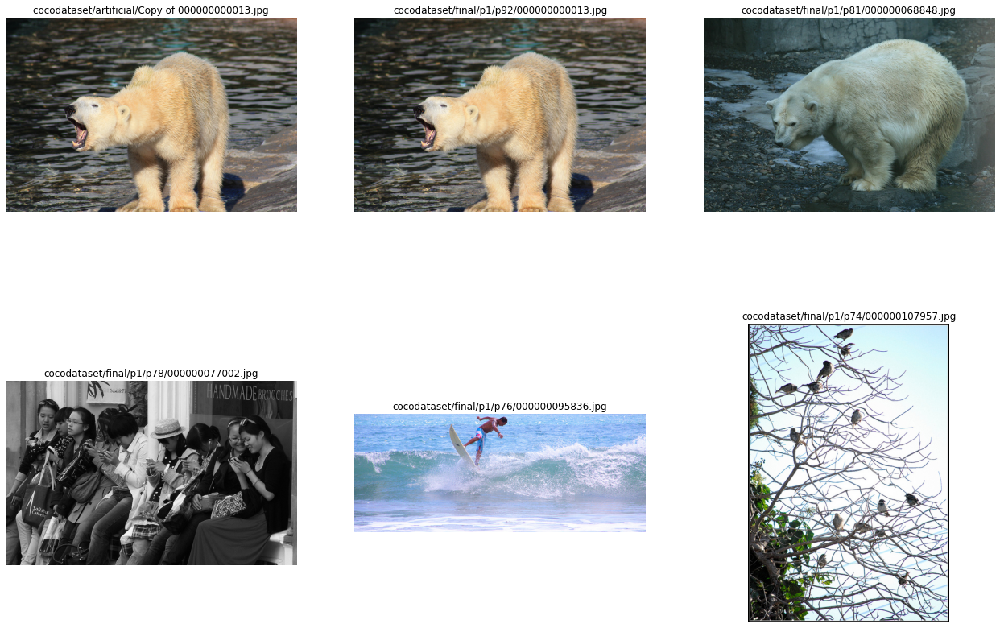

In [ ]:
plt.figure(figsize = (5,9))
plt.imshow(new_image)
plt.axis('off')
plt.title("Query image")

plt.figure(figsize=(22,15))
i=1
for x in final2[0:6]:
  plt.subplot(2,3,i)
  img = image.load_img(files[x[0]])
  plt.imshow(img)
  plt.axis('off')
  plt.title(files[x[0]][27:])
  i+=1

In [ ]:
5 image_rot_90.png
94 img_blur.png
/artificial/5.png
/artificial/42.png
32.png

SyntaxError: ignored